# E-1

# Histopathology Image Processing Pipeline
**Tasks:** Batch Loading · Radiometric Resolution · Filtering (Gaussian/Mean/Median) · PSNR/SSIM Metrics · Anti-Aliasing Downsampling

---

## 1. Install & Import Dependencies

In [ ]:
# Install required packages if not already installed
import subprocess, sys
subprocess.check_call([sys.executable, '-m', 'pip', 'install', 'scikit-image', 'opencv-python', 'matplotlib', 'numpy', 'pandas', 'tqdm', '--quiet'])
print('✅ Dependencies ready.')

✅ Dependencies ready.


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cv2
from pathlib import Path
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# scikit-image
from skimage import io, img_as_float, img_as_uint, img_as_ubyte
from skimage.filters import gaussian
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from skimage.transform import rescale, resize
from scipy.ndimage import uniform_filter, median_filter

print('✅ All libraries imported successfully.')

✅ All libraries imported successfully.


---
## 2. Configuration — Set Your Image Folder Path Here

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# ─────────────────────────────────────────────

IMAGE_DIR = '/content/drive/MyDrive/dataset_raw_patches'
# ─────────────────────────────────────────────

SUPPORTED_EXTENSIONS = {'.png', '.tif', '.tiff', '.jpg', '.jpeg', '.bmp'}

# Gaussian filter sigma
GAUSSIAN_SIGMA   = 1.0
# Mean (uniform) filter window size
MEAN_WINDOW      = 5
# Median filter window size
MEDIAN_WINDOW    = 5
# Downsampling scale factor (0 < scale < 1)
DOWNSAMPLE_SCALE = 0.5

# Output directory
OUTPUT_DIR = Path('/content/drive/MyDrive/outputs')
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
for sub in ['gaussian', 'mean', 'median', 'downsampled_aa', 'downsampled_no_aa']:
    (OUTPUT_DIR / sub).mkdir(exist_ok=True)

print(f'📁 Image directory : {IMAGE_DIR}')
print(f'📁 Output directory: {OUTPUT_DIR}')

📁 Image directory : /content/drive/MyDrive/dataset_raw_patches
📁 Output directory: /content/drive/MyDrive/outputs


---
## 3. Batch Loading

Found 100 image(s). Loading…


100%|██████████| 100/100 [00:42<00:00,  2.33img/s]


✅ Loaded 100 images.


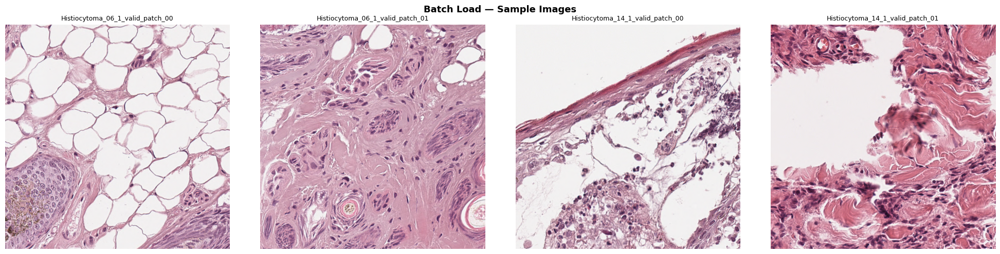

Preview saved → /content/drive/MyDrive/outputs/batch_preview.png


In [ ]:
def load_images_from_folder(folder: str) -> list[dict]:
    """
    Recursively load all supported images from a folder.
    Returns a list of dicts: {name, path, image (ndarray), dtype, shape}
    """
    folder = Path(folder)
    image_paths = sorted([
        p for p in folder.rglob('*')
        if p.suffix.lower() in SUPPORTED_EXTENSIONS
    ])

    if not image_paths:
        raise FileNotFoundError(
            f'No supported images found in "{folder}".\n'
            f'Supported extensions: {SUPPORTED_EXTENSIONS}')

    records = []
    print(f'Found {len(image_paths)} image(s). Loading…')
    for p in tqdm(image_paths, unit='img'):
        img = io.imread(str(p))          # preserves original dtype (uint8 / uint16)
        records.append({
            'name' : p.stem,
            'path' : str(p),
            'image': img,
            'dtype': img.dtype,
            'shape': img.shape,
        })
    print(f'✅ Loaded {len(records)} images.')
    return records


dataset = load_images_from_folder(IMAGE_DIR)

# Quick preview — first 4 images
n_preview = min(4, len(dataset))
fig, axes = plt.subplots(1, n_preview, figsize=(5 * n_preview, 5))
if n_preview == 1:
    axes = [axes]
for ax, rec in zip(axes, dataset[:n_preview]):
    ax.imshow(rec['image'] if rec['image'].ndim == 3 else rec['image'], cmap='gray')
    ax.set_title(rec['name'], fontsize=9)
    ax.axis('off')
plt.suptitle('Batch Load — Sample Images', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'batch_preview.png', dpi=150)
plt.show()
print(f'Preview saved → {OUTPUT_DIR / "batch_preview.png"}')

---
## 4. Radiometric Resolution — Bit-Depth Analysis

In [ ]:
def analyse_bit_depth(records: list[dict]) -> pd.DataFrame:
    """
    Determine bit-depth from dtype and actual pixel value range.
    Warns if apparent bit-depth < declared dtype (e.g. 12-bit data stored in uint16).
    """
    rows = []
    for rec in records:
        img  = rec['image']
        dt   = img.dtype
        vmin = int(img.min())
        vmax = int(img.max())

        if dt == np.uint8:
            declared_bits = 8
            max_possible  = 255
        elif dt == np.uint16:
            declared_bits = 16
            max_possible  = 65535
        elif dt == np.float32 or dt == np.float64:
            declared_bits = 'float'
            max_possible  = 1.0
        else:
            declared_bits = 'unknown'
            max_possible  = None

        # Estimate actual bits from pixel range
        actual_bits = int(np.ceil(np.log2(vmax + 1))) if vmax > 0 else 1

        false_contouring_risk = (
            'HIGH — reduce to ≤8-bit carefully'
            if declared_bits == 16 and actual_bits <= 8
            else ('LOW' if declared_bits == 8 else 'CHECK')
        )

        rows.append({
            'Image'              : rec['name'],
            'Shape'              : str(rec['shape']),
            'Dtype'              : str(dt),
            'Declared Bits'      : declared_bits,
            'Pixel Min'          : vmin,
            'Pixel Max'          : vmax,
            'Actual Bits (est.)' : actual_bits,
            'False Contouring Risk': false_contouring_risk,
        })
    return pd.DataFrame(rows)


bit_df = analyse_bit_depth(dataset)
print('\n📊 Radiometric Resolution Summary')
print('=' * 70)
print(bit_df.to_string(index=False))
bit_df.to_csv(OUTPUT_DIR / 'bit_depth_analysis.csv', index=False)
print(f'\n💾 Saved → {OUTPUT_DIR / "bit_depth_analysis.csv"}')


📊 Radiometric Resolution Summary
                             Image           Shape Dtype  Declared Bits  Pixel Min  Pixel Max  Actual Bits (est.) False Contouring Risk
  Histiocytoma_06_1_valid_patch_00 (1024, 1024, 3) uint8              8         19        255                   8                   LOW
  Histiocytoma_06_1_valid_patch_01 (1024, 1024, 3) uint8              8         28        255                   8                   LOW
  Histiocytoma_14_1_valid_patch_00 (1024, 1024, 3) uint8              8         19        255                   8                   LOW
  Histiocytoma_14_1_valid_patch_01 (1024, 1024, 3) uint8              8         10        255                   8                   LOW
  Histiocytoma_22_1_valid_patch_00 (1024, 1024, 3) uint8              8         16        255                   8                   LOW
  Histiocytoma_22_1_valid_patch_01 (1024, 1024, 3) uint8              8         23        253                   8                   LOW
  Histiocytoma

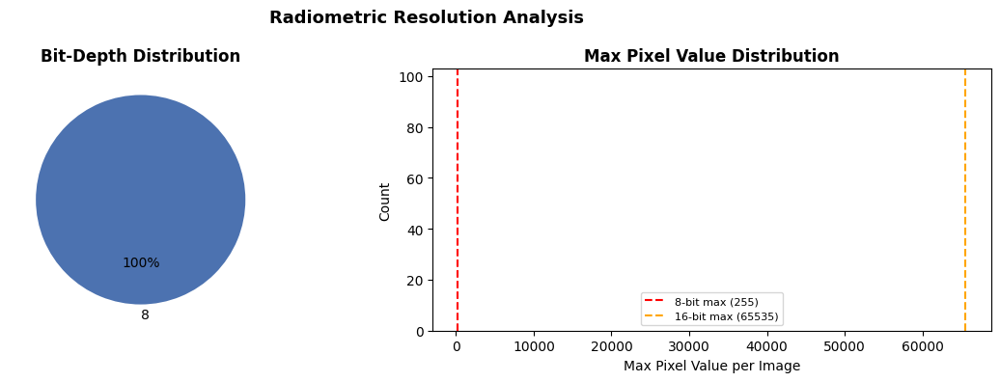

In [ ]:
# Visualise bit-depth distribution
bit_counts = bit_df['Declared Bits'].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Pie chart — bit-depth breakdown
axes[0].pie(bit_counts.values, labels=bit_counts.index,
            autopct='%1.0f%%', startangle=90,
            colors=['#4C72B0', '#DD8452', '#55A868'])
axes[0].set_title('Bit-Depth Distribution', fontweight='bold')

# Histogram of pixel max values across dataset
axes[1].hist(bit_df['Pixel Max'].astype(float), bins=20,
             color='#4C72B0', edgecolor='white', alpha=0.85)
axes[1].set_xlabel('Max Pixel Value per Image')
axes[1].set_ylabel('Count')
axes[1].set_title('Max Pixel Value Distribution', fontweight='bold')
axes[1].axvline(255,   color='red',    linestyle='--', label='8-bit max (255)')
axes[1].axvline(65535, color='orange', linestyle='--', label='16-bit max (65535)')
axes[1].legend(fontsize=8)

plt.suptitle('Radiometric Resolution Analysis', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'bit_depth_analysis.png', dpi=150)
plt.show()

---
## 5. Filtering — Gaussian · Mean · Median + PSNR/SSIM Metrics

In [ ]:
def safe_to_float(img: np.ndarray) -> np.ndarray:
    """Convert uint8 / uint16 to float64 in [0, 1] without precision loss."""
    return img_as_float(img)


def apply_gaussian_filter(img_float: np.ndarray, sigma: float = 1.0) -> np.ndarray:
    """
    Gaussian filter using skimage.filters.gaussian.
    Handles both grayscale and RGB images.
    """
    if img_float.ndim == 3:
        return gaussian(img_float, sigma=sigma, channel_axis=-1)
    return gaussian(img_float, sigma=sigma)


def apply_mean_filter(img_float: np.ndarray, window: int = 5) -> np.ndarray:
    """
    Mean (box) filter via scipy uniform_filter.
    Applied per-channel for RGB images.
    """
    if img_float.ndim == 3:
        return np.stack([
            uniform_filter(img_float[..., c], size=window)
            for c in range(img_float.shape[2])], axis=-1)
    return uniform_filter(img_float, size=window)


def apply_median_filter(img_float: np.ndarray, window: int = 5) -> np.ndarray:
    """
    Median filter via scipy median_filter.
    Applied per-channel for RGB images — preserves edges while removing impulse noise.
    """
    if img_float.ndim == 3:
        return np.stack([
            median_filter(img_float[..., c], size=window)
            for c in range(img_float.shape[2])], axis=-1)
    return median_filter(img_float, size=window)


def compute_metrics(original: np.ndarray, filtered: np.ndarray) -> tuple[float, float]:
    """
    Compute PSNR and SSIM between original and filtered float images.
    For RGB, SSIM is computed multichannel.
    """
    p = psnr(original, filtered, data_range=1.0)
    if original.ndim == 3:
        s = ssim(original, filtered, data_range=1.0, channel_axis=-1)
    else:
        s = ssim(original, filtered, data_range=1.0)
    return round(p, 4), round(s, 6)


print('✅ Filter functions defined.')

✅ Filter functions defined.


In [ ]:
metrics_rows = []

print('🔄 Applying filters to all images…')
for rec in tqdm(dataset, unit='img'):
    img_orig  = safe_to_float(rec['image'])
    name      = rec['name']

    # ── Apply filters ──────────────────────────────
    img_gauss  = apply_gaussian_filter(img_orig,  sigma=GAUSSIAN_SIGMA)
    img_mean   = apply_mean_filter    (img_orig,  window=MEAN_WINDOW)
    img_median = apply_median_filter  (img_orig,  window=MEDIAN_WINDOW)

    # ── Metrics ─────────────────────────────────────
    p_g, s_g = compute_metrics(img_orig, img_gauss)
    p_m, s_m = compute_metrics(img_orig, img_mean)
    p_md,s_md= compute_metrics(img_orig, img_median)

    metrics_rows.append({
        'Image'         : name,
        'PSNR_Gaussian' : p_g,  'SSIM_Gaussian' : s_g,
        'PSNR_Mean'     : p_m,  'SSIM_Mean'     : s_m,
        'PSNR_Median'   : p_md, 'SSIM_Median'   : s_md,
    })

    # ── Save filtered images ─────────────────────────
    def _save(folder, img_f, fname):
        out_path = OUTPUT_DIR / folder / (fname + '.png')
        # Clip to [0,1] before converting
        img_clipped = np.clip(img_f, 0, 1)
        io.imsave(str(out_path), img_as_ubyte(img_clipped))

    _save('gaussian', img_gauss,  name)
    _save('mean',     img_mean,   name)
    _save('median',   img_median, name)

metrics_df = pd.DataFrame(metrics_rows)
metrics_df.to_csv(OUTPUT_DIR / 'filter_metrics.csv', index=False)
print(f'\n✅ Done. Metrics saved → {OUTPUT_DIR / "filter_metrics.csv"}')
print(metrics_df.to_string(index=False))

🔄 Applying filters to all images…


100%|██████████| 100/100 [07:48<00:00,  4.69s/img]


✅ Done. Metrics saved → /content/drive/MyDrive/outputs/filter_metrics.csv
                             Image  PSNR_Gaussian  SSIM_Gaussian  PSNR_Mean  SSIM_Mean  PSNR_Median  SSIM_Median
  Histiocytoma_06_1_valid_patch_00        32.7868       0.943128    28.4285   0.865704      30.1018     0.898685
  Histiocytoma_06_1_valid_patch_01        33.0756       0.933387    28.7213   0.822175      30.2574     0.860820
  Histiocytoma_14_1_valid_patch_00        33.7444       0.943167    29.4266   0.879365      31.0340     0.901738
  Histiocytoma_14_1_valid_patch_01        33.8130       0.937792    29.4812   0.864190      31.1816     0.890138
  Histiocytoma_22_1_valid_patch_00        32.6881       0.928807    28.3536   0.799033      29.7323     0.847326
  Histiocytoma_22_1_valid_patch_01        46.1051       0.985483    41.8303   0.965154      42.4028     0.967917
  Histiocytoma_25_1_valid_patch_00        28.6537       0.915254    24.2534   0.754439      25.7288     0.813399
  Histiocytoma_25_1_v


📊 Filter Metrics — Summary Statistics
      PSNR_Gaussian  SSIM_Gaussian  PSNR_Mean  SSIM_Mean  PSNR_Median  SSIM_Median
mean      32.281488       0.936216  27.847385   0.827376    29.396986     0.864894
std        2.676678       0.018989   2.825201   0.051597     2.861121     0.043444
min       28.398900       0.875931  23.801700   0.712219    25.237500     0.757524
max       46.448900       0.991876  42.258700   0.981021    44.231400     0.984554


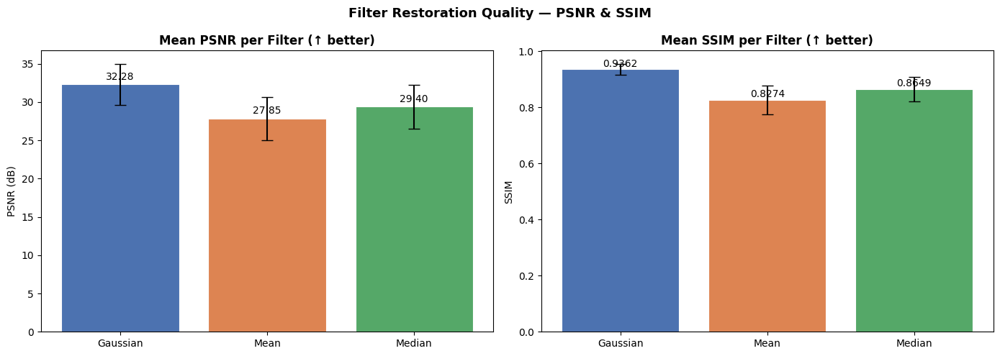

Chart saved → /content/drive/MyDrive/outputs/filter_metrics_chart.png


In [ ]:
# ── Summary statistics ──────────────────────────────────────────────────────
numeric_cols = [c for c in metrics_df.columns if c != 'Image']
summary = metrics_df[numeric_cols].describe().loc[['mean', 'std', 'min', 'max']]
print('\n📊 Filter Metrics — Summary Statistics')
print('=' * 72)
print(summary.to_string())

# ── Grouped bar chart ────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

filters      = ['Gaussian', 'Mean', 'Median']
psnr_means   = [metrics_df[f'PSNR_{f}'].mean() for f in filters]
ssim_means   = [metrics_df[f'SSIM_{f}'].mean() for f in filters]
psnr_stds    = [metrics_df[f'PSNR_{f}'].std()  for f in filters]
ssim_stds    = [metrics_df[f'SSIM_{f}'].std()  for f in filters]

colors = ['#4C72B0', '#DD8452', '#55A868']
x = np.arange(len(filters))

bars = axes[0].bar(x, psnr_means, yerr=psnr_stds, color=colors,
                   capsize=6, edgecolor='white', linewidth=0.8)
axes[0].set_xticks(x); axes[0].set_xticklabels(filters)
axes[0].set_ylabel('PSNR (dB)')
axes[0].set_title('Mean PSNR per Filter (↑ better)', fontweight='bold')
for bar, val in zip(bars, psnr_means):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.3,
                 f'{val:.2f}', ha='center', va='bottom', fontsize=10)

bars2 = axes[1].bar(x, ssim_means, yerr=ssim_stds, color=colors,
                    capsize=6, edgecolor='white', linewidth=0.8)
axes[1].set_xticks(x); axes[1].set_xticklabels(filters)
axes[1].set_ylabel('SSIM')
axes[1].set_title('Mean SSIM per Filter (↑ better)', fontweight='bold')
for bar, val in zip(bars2, ssim_means):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.002,
                 f'{val:.4f}', ha='center', va='bottom', fontsize=10)

plt.suptitle('Filter Restoration Quality — PSNR & SSIM', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'filter_metrics_chart.png', dpi=150)
plt.show()
print(f'Chart saved → {OUTPUT_DIR / "filter_metrics_chart.png"}')

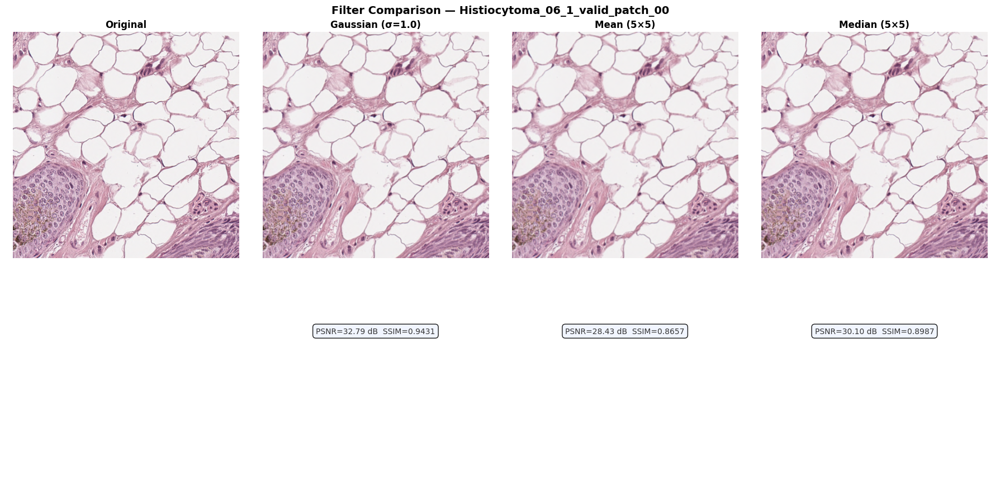

Comparison saved → /content/drive/MyDrive/outputs/filter_comparison.png


In [ ]:
# ── Visual comparison panel (first image) ────────────────────────────────────
rec       = dataset[0]
img_orig  = safe_to_float(rec['image'])
img_gauss = apply_gaussian_filter(img_orig, sigma=GAUSSIAN_SIGMA)
img_mean  = apply_mean_filter    (img_orig, window=MEAN_WINDOW)
img_mdn   = apply_median_filter  (img_orig, window=MEDIAN_WINDOW)

titles = ['Original', f'Gaussian (σ={GAUSSIAN_SIGMA})',
          f'Mean ({MEAN_WINDOW}×{MEAN_WINDOW})',
          f'Median ({MEDIAN_WINDOW}×{MEDIAN_WINDOW})']
images = [img_orig, img_gauss, img_mean, img_mdn]

# Metrics for subtitle labels
row = metrics_df[metrics_df['Image'] == rec['name']].iloc[0]
subtitles = [
    '',
    f"PSNR={row['PSNR_Gaussian']:.2f} dB  SSIM={row['SSIM_Gaussian']:.4f}",
    f"PSNR={row['PSNR_Mean']:.2f} dB  SSIM={row['SSIM_Mean']:.4f}",
    f"PSNR={row['PSNR_Median']:.2f} dB  SSIM={row['SSIM_Median']:.4f}",
]

fig, axes = plt.subplots(2, 4, figsize=(18, 9))
cmap_arg = None if img_orig.ndim == 3 else 'gray'

for i, (ax_top, ax_bot, img, title, sub) in enumerate(
        zip(axes[0], axes[1], images, titles, subtitles)):
    ax_top.imshow(np.clip(img, 0, 1), cmap=cmap_arg)
    ax_top.set_title(title, fontweight='bold')
    ax_top.axis('off')
    ax_bot.set_axis_off()
    if sub:
        ax_bot.text(0.5, 0.7, sub, ha='center', va='center',
                    fontsize=10, color='#333333',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='#f0f4ff', alpha=0.9))

plt.suptitle(f'Filter Comparison — {rec["name"]}', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'filter_comparison.png', dpi=150)
plt.show()
print(f'Comparison saved → {OUTPUT_DIR / "filter_comparison.png"}')

---
## 6. Anti-Aliasing Downsampling

**Why it matters:** Downsampling without a low-pass pre-filter causes high-frequency moiré patterns / checkerboard artefacts in histopathology patches. A Gaussian pre-filter removes spatial frequencies above the Nyquist limit of the new grid before resampling.

In [ ]:
def downsample_with_anti_aliasing(
        img_float: np.ndarray,
        scale: float = 0.5,
        aa_sigma: float | None = None) -> np.ndarray:
    """
    Gaussian pre-filter THEN downsample.

    sigma is set to (1/scale) / (2*pi) ≈ 0.4/scale by default
    — this is the standard anti-aliasing kernel for the given scale factor.
    skimage.transform.rescale with anti_aliasing=True does the same internally,
    but here we do it explicitly for teaching transparency.
    """
    if aa_sigma is None:
        # Recommended: sigma ~ 0.5 * (1/scale) to remove frequencies > Nyquist
        aa_sigma = 0.5 * (1.0 / scale)

    # Step 1 — Gaussian pre-filter (removes high frequencies)
    if img_float.ndim == 3:
        img_blurred = gaussian(img_float, sigma=aa_sigma, channel_axis=-1)
    else:
        img_blurred = gaussian(img_float, sigma=aa_sigma)

    # Step 2 — Downsample (nearest neighbour / bilinear interpolation order=1)
    if img_float.ndim == 3:
        img_down = rescale(img_blurred, scale=(scale, scale, 1), order=1,
                           anti_aliasing=False, channel_axis=-1)
    else:
        img_down = rescale(img_blurred, scale=scale, order=1,
                           anti_aliasing=False)
    return img_down


def downsample_no_anti_aliasing(
        img_float: np.ndarray,
        scale: float = 0.5) -> np.ndarray:
    """
    Naïve downsample without pre-filter — produces checkerboard artefacts.
    Included for comparison only.
    """
    if img_float.ndim == 3:
        return rescale(img_float, scale=(scale, scale, 1), order=0,
                       anti_aliasing=False, channel_axis=-1)
    return rescale(img_float, scale=scale, order=0, anti_aliasing=False)


print('✅ Anti-aliasing functions defined.')

✅ Anti-aliasing functions defined.


In [ ]:
def downsample_with_anti_aliasing(
        img_float: np.ndarray,
        scale: float = 0.5,
        aa_sigma: float | None = None) -> np.ndarray:
    """
    Gaussian pre-filter THEN downsample.

    sigma is set to (1/scale) / (2*pi) ≈ 0.4/scale by default
    — this is the standard anti-aliasing kernel for the given scale factor.
    skimage.transform.rescale with anti_aliasing=True does the same internally,
    but here we do it explicitly for teaching transparency.
    """
    if aa_sigma is None:
        # Recommended: sigma ~ 0.5 * (1/scale) to remove frequencies > Nyquist
        aa_sigma = 0.5 * (1.0 / scale)

    # Step 1 — Gaussian pre-filter (removes high frequencies)
    if img_float.ndim == 3:
        img_blurred = gaussian(img_float, sigma=aa_sigma, channel_axis=-1)
    else:
        img_blurred = gaussian(img_float, sigma=aa_sigma)

    # Step 2 — Downsample (nearest neighbour / bilinear interpolation order=1)
    if img_float.ndim == 3:
        img_down = rescale(img_blurred, scale=(scale, scale), order=1,
                           anti_aliasing=False, channel_axis=-1) # Fixed: removed '1' from scale tuple
    else:
        img_down = rescale(img_blurred, scale=scale, order=1,
                           anti_aliasing=False)
    return img_down


def downsample_no_anti_aliasing(
        img_float: np.ndarray,
        scale: float = 0.5) -> np.ndarray:
    """
    Naïve downsample without pre-filter — produces checkerboard artefacts.
    Included for comparison only.
    """
    if img_float.ndim == 3:
        return rescale(img_float, scale=(scale, scale), order=0, # Fixed: removed '1' from scale tuple
                       anti_aliasing=False, channel_axis=-1)
    return rescale(img_float, scale=scale, order=0, anti_aliasing=False)


aa_metrics = []

print(f'🔄 Downsampling (scale={DOWNSAMPLE_SCALE}) with and without anti-aliasing…')
for rec in tqdm(dataset, unit='img'):
    img_f  = safe_to_float(rec['image'])
    name   = rec['name']

    img_aa    = downsample_with_anti_aliasing(img_f,  scale=DOWNSAMPLE_SCALE)
    img_no_aa = downsample_no_anti_aliasing  (img_f,  scale=DOWNSAMPLE_SCALE)

    # Upsample back to original size for fair metric comparison
    target_shape = img_f.shape[:2]
    if img_f.ndim == 3:
        img_aa_up    = resize(img_aa,    (*target_shape, img_f.shape[2]),
                              order=1, anti_aliasing=False)
        img_no_aa_up = resize(img_no_aa, (*target_shape, img_f.shape[2]),
                              order=1, anti_aliasing=False)
    else:
        img_aa_up    = resize(img_aa,    target_shape, order=1, anti_aliasing=False)
        img_no_aa_up = resize(img_no_aa, target_shape, order=1, anti_aliasing=False)

    p_aa,  s_aa  = compute_metrics(img_f, img_aa_up)
    p_naa, s_naa = compute_metrics(img_f, img_no_aa_up)

    aa_metrics.append({
        'Image'          : name,
        'PSNR_AA'        : p_aa,  'SSIM_AA'        : s_aa,
        'PSNR_No_AA'     : p_naa, 'SSIM_No_AA'     : s_naa,
        'PSNR_Gain'      : round(p_aa - p_naa, 4),
        'SSIM_Gain'      : round(s_aa - s_naa, 6),
    })

    def _save_ds(folder, img_ds, fname):
        io.imsave(str(OUTPUT_DIR / folder / (fname + '.png')),
                  img_as_ubyte(np.clip(img_ds, 0, 1)))

    _save_ds('downsampled_aa',    img_aa,    name)
    _save_ds('downsampled_no_aa', img_no_aa, name)

aa_df = pd.DataFrame(aa_metrics)
aa_df.to_csv(OUTPUT_DIR / 'antialiasing_metrics.csv', index=False)
print(f'\n✅ Done. Metrics saved → {OUTPUT_DIR / "antialiasing_metrics.csv"}')
print(aa_df.to_string(index=False))

🔄 Downsampling (scale=0.5) with and without anti-aliasing…


100%|██████████| 100/100 [03:06<00:00,  1.86s/img]


✅ Done. Metrics saved → /content/drive/MyDrive/outputs/antialiasing_metrics.csv
                             Image  PSNR_AA  SSIM_AA  PSNR_No_AA  SSIM_No_AA  PSNR_Gain  SSIM_Gain
  Histiocytoma_06_1_valid_patch_00  29.3283 0.889923     29.3801    0.903303    -0.0518  -0.013380
  Histiocytoma_06_1_valid_patch_01  29.5987 0.857526     29.4955    0.881728     0.1032  -0.024202
  Histiocytoma_14_1_valid_patch_00  30.2212 0.898208     29.7306    0.903911     0.4906  -0.005703
  Histiocytoma_14_1_valid_patch_01  30.2879 0.886674     30.2748    0.900835     0.0131  -0.014161
  Histiocytoma_22_1_valid_patch_00  29.3085 0.842461     30.6956    0.898583    -1.3871  -0.056122
  Histiocytoma_22_1_valid_patch_01  42.5288 0.971751     41.6627    0.973941     0.8661  -0.002190
  Histiocytoma_25_1_valid_patch_00  25.2044 0.808351     25.5842    0.857307    -0.3798  -0.048956
  Histiocytoma_25_1_valid_patch_01  27.1740 0.871764     27.8172    0.908908    -0.6432  -0.037144
  Histiocytoma_33_1_valid_pa

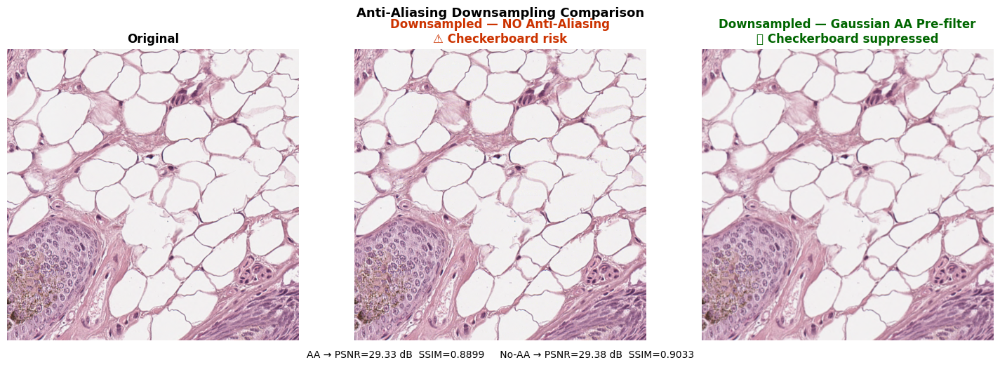

Anti-aliasing comparison saved → /content/drive/MyDrive/outputs/antialiasing_comparison.png


In [ ]:
# ── Visual comparison: AA vs No-AA (first image) ─────────────────────────────
rec     = dataset[0]
img_f   = safe_to_float(rec['image'])

img_aa    = downsample_with_anti_aliasing(img_f, scale=DOWNSAMPLE_SCALE)
img_no_aa = downsample_no_anti_aliasing  (img_f, scale=DOWNSAMPLE_SCALE)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
cmap_arg = None if img_f.ndim == 3 else 'gray'

axes[0].imshow(np.clip(img_f, 0, 1),     cmap=cmap_arg)
axes[0].set_title('Original',            fontweight='bold')
axes[0].set_xlabel(f'Size: {img_f.shape[:2]}')
axes[0].axis('off')

axes[1].imshow(np.clip(img_no_aa, 0, 1), cmap=cmap_arg)
axes[1].set_title('Downsampled — NO Anti-Aliasing\n⚠ Checkerboard risk', fontweight='bold', color='#CC3300')
axes[1].set_xlabel(f'Size: {img_no_aa.shape[:2]}')
axes[1].axis('off')

axes[2].imshow(np.clip(img_aa, 0, 1),    cmap=cmap_arg)
axes[2].set_title('Downsampled — Gaussian AA Pre-filter\n✅ Checkerboard suppressed', fontweight='bold', color='#006600')
axes[2].set_xlabel(f'Size: {img_aa.shape[:2]}')
axes[2].axis('off')

aa_row = aa_df[aa_df['Image'] == rec['name']].iloc[0]
fig.text(0.5, -0.02,
         f"AA → PSNR={aa_row['PSNR_AA']:.2f} dB  SSIM={aa_row['SSIM_AA']:.4f}     "
         f"No-AA → PSNR={aa_row['PSNR_No_AA']:.2f} dB  SSIM={aa_row['SSIM_No_AA']:.4f}",
         ha='center', fontsize=10)

plt.suptitle('Anti-Aliasing Downsampling Comparison', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'antialiasing_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Anti-aliasing comparison saved → {OUTPUT_DIR / "antialiasing_comparison.png"}')

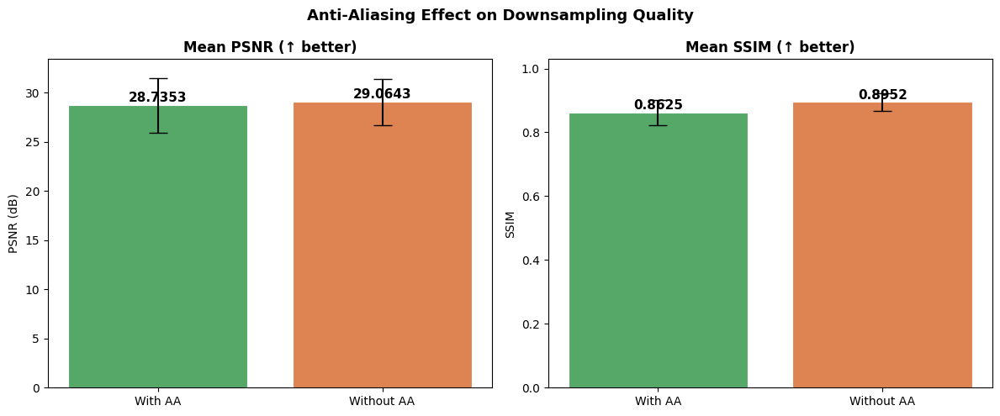


📈 Average PSNR gain from anti-aliasing : -0.3291 dB
📈 Average SSIM gain from anti-aliasing  : -0.032743


In [ ]:
# ── AA vs No-AA metrics bar chart ─────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

groups      = ['With AA', 'Without AA']
psnr_vals   = [aa_df['PSNR_AA'].mean(),    aa_df['PSNR_No_AA'].mean()]
ssim_vals   = [aa_df['SSIM_AA'].mean(),    aa_df['SSIM_No_AA'].mean()]
psnr_err    = [aa_df['PSNR_AA'].std(),     aa_df['PSNR_No_AA'].std()]
ssim_err    = [aa_df['SSIM_AA'].std(),     aa_df['SSIM_No_AA'].std()]
bar_colors  = ['#55A868', '#DD8452']

for ax, vals, errs, ylabel, title in zip(
    axes,
    [psnr_vals, ssim_vals],
    [psnr_err,  ssim_err],
    ['PSNR (dB)', 'SSIM'],
    ['Mean PSNR (↑ better)', 'Mean SSIM (↑ better)'],
):
    b = ax.bar(groups, vals, yerr=errs, color=bar_colors,
               capsize=8, edgecolor='white', linewidth=0.8)
    for bar, v in zip(b, vals):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(errs)*0.05,
                f'{v:.4f}', ha='center', va='bottom', fontsize=11, fontweight='bold')
    ax.set_ylabel(ylabel)
    ax.set_title(title, fontweight='bold')
    ax.set_ylim(0, max(vals) * 1.15)

plt.suptitle('Anti-Aliasing Effect on Downsampling Quality', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'antialiasing_metrics_chart.png', dpi=150)
plt.show()

# Print gain summary
print(f"\n📈 Average PSNR gain from anti-aliasing : {aa_df['PSNR_Gain'].mean():+.4f} dB")
print(f"📈 Average SSIM gain from anti-aliasing  : {aa_df['SSIM_Gain'].mean():+.6f}")

---
## 7. Final Summary Dashboard

In [ ]:
print('=' * 70)
print('                PIPELINE SUMMARY')
print('=' * 70)
print(f'  Total images processed     : {len(dataset)}')
print(f'  Bit-depth CSV              : {OUTPUT_DIR}/bit_depth_analysis.csv')
print(f'  Filter metrics CSV         : {OUTPUT_DIR}/filter_metrics.csv')
print(f'  Anti-aliasing metrics CSV  : {OUTPUT_DIR}/antialiasing_metrics.csv')
print()

# Best filter by PSNR and SSIM
avg_psnr = {f: metrics_df[f'PSNR_{f}'].mean() for f in ['Gaussian', 'Mean', 'Median']}
avg_ssim = {f: metrics_df[f'SSIM_{f}'].mean() for f in ['Gaussian', 'Mean', 'Median']}
best_psnr = max(avg_psnr, key=avg_psnr.get)
best_ssim = max(avg_ssim, key=avg_ssim.get)

print(f'  Best filter (PSNR) : {best_psnr} ({avg_psnr[best_psnr]:.2f} dB)')
print(f'  Best filter (SSIM) : {best_ssim} ({avg_ssim[best_ssim]:.6f})')
print()
print(f"  AA PSNR gain (mean): {aa_df['PSNR_Gain'].mean():+.4f} dB")
print(f"  AA SSIM gain (mean): {aa_df['SSIM_Gain'].mean():+.6f}")
print('=' * 70)
print('  ✅ All outputs saved to:', OUTPUT_DIR.resolve())
print('=' * 70)

                PIPELINE SUMMARY
  Total images processed     : 100
  Bit-depth CSV              : /content/drive/MyDrive/outputs/bit_depth_analysis.csv
  Filter metrics CSV         : /content/drive/MyDrive/outputs/filter_metrics.csv
  Anti-aliasing metrics CSV  : /content/drive/MyDrive/outputs/antialiasing_metrics.csv

  Best filter (PSNR) : Gaussian (32.28 dB)
  Best filter (SSIM) : Gaussian (0.936216)

  AA PSNR gain (mean): -0.3291 dB
  AA SSIM gain (mean): -0.032743
  ✅ All outputs saved to: /content/drive/MyDrive/outputs


## 1. Install & Import Dependencies

In [ ]:
import subprocess, sys
subprocess.check_call([sys.executable, '-m', 'pip', 'install',
                       'scikit-image', 'opencv-python', 'matplotlib',
                       'numpy', 'pandas', 'tqdm', '--quiet'])
print('✅ Dependencies ready.')

✅ Dependencies ready.


In [ ]:
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import cv2
from pathlib import Path
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

from skimage import io, img_as_ubyte, img_as_float
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.feature import canny
from skimage.morphology import (erosion, dilation, opening, closing,
                                 disk, remove_small_objects)
from skimage.measure import label, regionprops
from scipy.ndimage import binary_fill_holes

print('✅ All libraries imported successfully.')

✅ All libraries imported successfully.


---
## 2. Configuration — Set Your Image Folder Path Here

In [ ]:
# ─────────────────────────────────────────────

IMAGE_DIR = '/content/drive/MyDrive/dataset_raw_patches'
# ─────────────────────────────────────────────

SUPPORTED_EXTENSIONS = {'.png', '.tif', '.tiff', '.jpg', '.jpeg', '.bmp'}

# ── Segmentation settings ──────────────────────────────────────────
EDGE_METHOD        = 'canny'   # 'canny' or 'sobel'
CANNY_SIGMA        = 1.0       # Gaussian sigma for Canny
CANNY_LOW_THRESH   = 0.1       # Low hysteresis threshold  (fraction of max)
CANNY_HIGH_THRESH  = 0.3       # High hysteresis threshold (fraction of max)
SOBEL_THRESH       = 0.05      # Binary threshold after Sobel magnitude

# ── Morphological settings ─────────────────────────────────────────
MORPH_RADIUS       = 2         # Disk structuring element radius
MIN_OBJECT_SIZE    = 100       # Pixels — small objects smaller than this are removed

# ── Output directory ───────────────────────────────────────────────
OUTPUT_DIR = Path('/content/drive/MyDrive/outputs/shape_analysis_output')
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
for sub in ['masks_raw', 'masks_clean', 'chain_codes', 'convex_hulls']:
    (OUTPUT_DIR / sub).mkdir(exist_ok=True)

print(f'📁 Image directory : {IMAGE_DIR}')
print(f'📁 Output directory: {OUTPUT_DIR}')
print(f'🔧 Edge method     : {EDGE_METHOD}')
print(f'🔧 Morph SE radius : {MORPH_RADIUS}')

📁 Image directory : /content/drive/MyDrive/dataset_raw_patches
📁 Output directory: /content/drive/MyDrive/outputs/shape_analysis_output
🔧 Edge method     : canny
🔧 Morph SE radius : 2


---
## 3. Batch Image Loading

Found 100 image(s). Loading…


100%|██████████| 100/100 [00:15<00:00,  6.25img/s]


✅ Loaded 100 images.


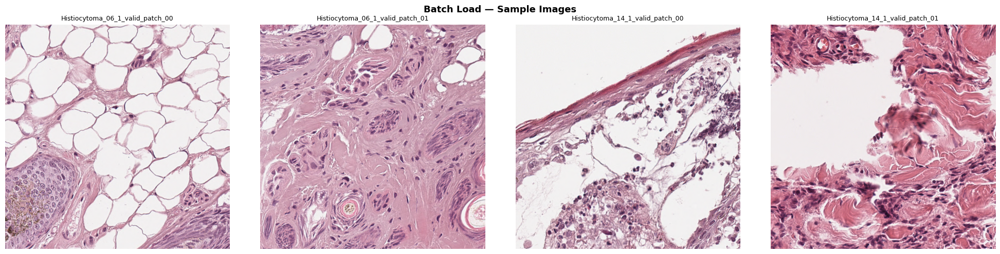

Preview saved → /content/drive/MyDrive/outputs/shape_analysis_output/batch_preview.png


In [ ]:
def load_images_from_folder(folder: str) -> list[dict]:
    """
    Recursively load all supported images from a folder.
    Returns a list of dicts: {name, path, image (ndarray), gray (float64)}
    """
    folder = Path(folder)
    image_paths = sorted([
        p for p in folder.rglob('*')
        if p.suffix.lower() in SUPPORTED_EXTENSIONS
    ])

    if not image_paths:
        raise FileNotFoundError(
            f'No supported images found in "{folder}".\n'
            f'Supported extensions: {SUPPORTED_EXTENSIONS}')

    records = []
    print(f'Found {len(image_paths)} image(s). Loading…')
    for p in tqdm(image_paths, unit='img'):
        img = io.imread(str(p))
        # Convert to float grayscale for processing
        if img.ndim == 3:
            gray = rgb2gray(img_as_float(img))
        else:
            gray = img_as_float(img)
        records.append({
            'name' : p.stem,
            'path' : str(p),
            'image': img,
            'gray' : gray,
            'shape': img.shape,
        })
    print(f'✅ Loaded {len(records)} images.')
    return records


dataset = load_images_from_folder(IMAGE_DIR)

# Quick preview — first 4 images
n_preview = min(4, len(dataset))
fig, axes = plt.subplots(1, n_preview, figsize=(5 * n_preview, 5))
if n_preview == 1:
    axes = [axes]
for ax, rec in zip(axes, dataset[:n_preview]):
    ax.imshow(rec['image'] if rec['image'].ndim == 3 else rec['gray'], cmap='gray')
    ax.set_title(rec['name'], fontsize=9)
    ax.axis('off')
plt.suptitle('Batch Load — Sample Images', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'batch_preview.png', dpi=150)
plt.show()
print(f'Preview saved → {OUTPUT_DIR / "batch_preview.png"}')

---
## 4. Segmentation (Masking) — Canny / Sobel Edge Detection

**Canny**: multi-stage detector — Gaussian smoothing → gradient magnitude → non-maximum suppression → double-threshold hysteresis. Produces thin, closed edges, ideal for clean binary masks.

**Sobel**: computes the gradient magnitude in X and Y; thresholded to produce a binary edge map. Faster but more sensitive to noise.

In [ ]:
def segment_canny(gray: np.ndarray,
                  sigma: float = CANNY_SIGMA,
                  low_thresh:  float = CANNY_LOW_THRESH,
                  high_thresh: float = CANNY_HIGH_THRESH) -> np.ndarray:
    """
    Apply Canny edge detection to produce a binary edge mask.

    Steps:
    1. Gaussian smoothing (controlled by sigma).
    2. Gradient magnitude + direction via Sobel kernels.
    3. Non-maximum suppression — thinning edges to 1-pixel width.
    4. Double-threshold hysteresis: strong edges kept, weak edges kept
       only if connected to a strong edge.
    5. Fill internal holes so the mask covers the full object region.

    Parameters
    ----------
    gray        : float64 grayscale image in [0, 1]
    sigma       : Gaussian smoothing sigma (larger = more smoothing, fewer edges)
    low_thresh  : weak-edge threshold as fraction of image max gradient
    high_thresh : strong-edge threshold as fraction of image max gradient

    Returns
    -------
    Binary mask (bool ndarray, same HxW as input)
    """
    edges = canny(gray, sigma=sigma,
                  low_threshold=low_thresh,
                  high_threshold=high_thresh,
                  use_quantiles=True)   # thresholds as quantiles of gradient magnitude
    # Fill holes so we get filled regions, not just outlines
    mask = binary_fill_holes(edges)
    return mask


def segment_sobel(gray: np.ndarray,
                  threshold: float = SOBEL_THRESH) -> np.ndarray:
    """
    Apply Sobel edge detection to produce a binary edge mask.

    Steps:
    1. Compute Sobel gradient magnitude:  mag = sqrt(Gx² + Gy²)
       where Gx and Gy are horizontal and vertical Sobel responses.
    2. Threshold the magnitude map to obtain a binary edge image.
    3. Fill internal holes.

    Parameters
    ----------
    gray      : float64 grayscale image in [0, 1]
    threshold : magnitude threshold in [0, 1] (lower = more edges detected)

    Returns
    -------
    Binary mask (bool ndarray, same HxW as input)
    """
    mag = sobel(gray)          # skimage.filters.sobel returns magnitude
    edges = mag > threshold
    mask = binary_fill_holes(edges)
    return mask


def apply_segmentation(gray: np.ndarray,
                        method: str = EDGE_METHOD) -> np.ndarray:
    """Dispatch to the selected edge detector."""
    if method == 'canny':
        return segment_canny(gray)
    elif method == 'sobel':
        return segment_sobel(gray)
    else:
        raise ValueError(f'Unknown EDGE_METHOD "{method}". Choose "canny" or "sobel".')


print('✅ Segmentation functions defined.')

✅ Segmentation functions defined.


🔄 Segmenting images using CANNY edge detection…


100%|██████████| 100/100 [00:47<00:00,  2.11img/s]


✅ Raw masks computed and saved.


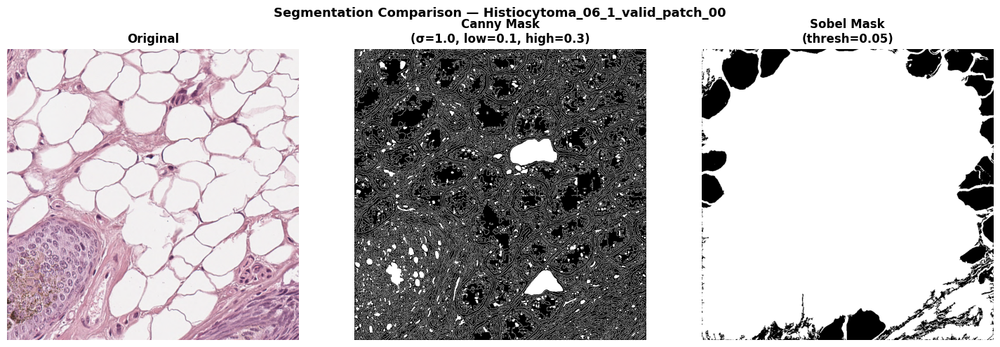

Segmentation comparison saved → /content/drive/MyDrive/outputs/shape_analysis_output/segmentation_comparison.png


In [ ]:
# Apply segmentation to the full dataset and store raw masks
print(f'🔄 Segmenting images using {EDGE_METHOD.upper()} edge detection…')
for rec in tqdm(dataset, unit='img'):
    rec['mask_raw'] = apply_segmentation(rec['gray'])
    io.imsave(
        str(OUTPUT_DIR / 'masks_raw' / (rec['name'] + '_mask_raw.png')),
        img_as_ubyte(rec['mask_raw'])
    )
print('✅ Raw masks computed and saved.')

# ── Visual comparison: original + canny mask + sobel mask for first image ───
rec = dataset[0]
canny_mask = segment_canny(rec['gray'])
sobel_mask = segment_sobel(rec['gray'])

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
cmap_orig = None if rec['image'].ndim == 3 else 'gray'
axes[0].imshow(rec['image'], cmap=cmap_orig); axes[0].set_title('Original',         fontweight='bold'); axes[0].axis('off')
axes[1].imshow(canny_mask,   cmap='gray');    axes[1].set_title(f'Canny Mask\n(σ={CANNY_SIGMA}, low={CANNY_LOW_THRESH}, high={CANNY_HIGH_THRESH})', fontweight='bold'); axes[1].axis('off')
axes[2].imshow(sobel_mask,   cmap='gray');    axes[2].set_title(f'Sobel Mask\n(thresh={SOBEL_THRESH})', fontweight='bold'); axes[2].axis('off')
plt.suptitle(f'Segmentation Comparison — {rec["name"]}', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'segmentation_comparison.png', dpi=150)
plt.show()
print(f'Segmentation comparison saved → {OUTPUT_DIR / "segmentation_comparison.png"}')

---
## 5. Morphological Cleaning

Raw binary masks typically contain:
- **Salt-and-pepper noise** (isolated white pixels / small holes) — removed by Opening and Closing.
- **Thin bridges** between regions — broken by Erosion.
- **Gaps / small holes** inside objects — filled by Dilation and Closing.

**Pipeline applied in order:**
1. **Erosion** — shrinks white regions; eliminates thin protrusions and salt noise.
2. **Dilation** — expands white regions; fills small holes and restores size after erosion.
3. **Opening** (Erosion → Dilation) — removes small bright blobs (salt noise) without significantly altering the overall shape.
4. **Closing** (Dilation → Erosion) — fills small dark holes (pepper noise) inside objects.
5. **Remove small objects** — eliminates connected components below `MIN_OBJECT_SIZE` pixels.

In [ ]:
def morphological_clean(mask: np.ndarray,
                         radius: int = MORPH_RADIUS,
                         min_size: int = MIN_OBJECT_SIZE) -> dict:
    """
    Apply a full morphological cleaning pipeline to a binary mask.

    Parameters
    ----------
    mask    : binary input mask (bool or uint8)
    radius  : radius of the disk-shaped structuring element
    min_size: minimum connected-component size in pixels (smaller are removed)

    Returns
    -------
    dict with keys:
        'eroded'   — after erosion only
        'dilated'  — after dilation only
        'opened'   — after opening  (erosion → dilation)
        'closed'   — after closing  (dilation → erosion)
        'clean'    — final mask after closing + small-object removal
    """
    se = disk(radius)     # circular (isotropic) structuring element

    m = mask.astype(bool)

    eroded  = erosion(m,  se)   # shrink — removes salt noise / thin protrusions
    dilated = dilation(m, se)   # expand — fills pepper holes
    opened  = opening(m,  se)   # erosion then dilation — kills small bright blobs
    closed  = closing(m,  se)   # dilation then erosion — fills small dark holes

    # Final clean mask: close first then remove tiny components
    clean = remove_small_objects(closed, min_size=min_size)

    return {
        'eroded' : eroded,
        'dilated': dilated,
        'opened' : opened,
        'closed' : closed,
        'clean'  : clean,
    }


print('✅ Morphological cleaning function defined.')

✅ Morphological cleaning function defined.


🔄 Applying morphological cleaning…


100%|██████████| 100/100 [00:45<00:00,  2.17img/s]


✅ Clean masks saved.


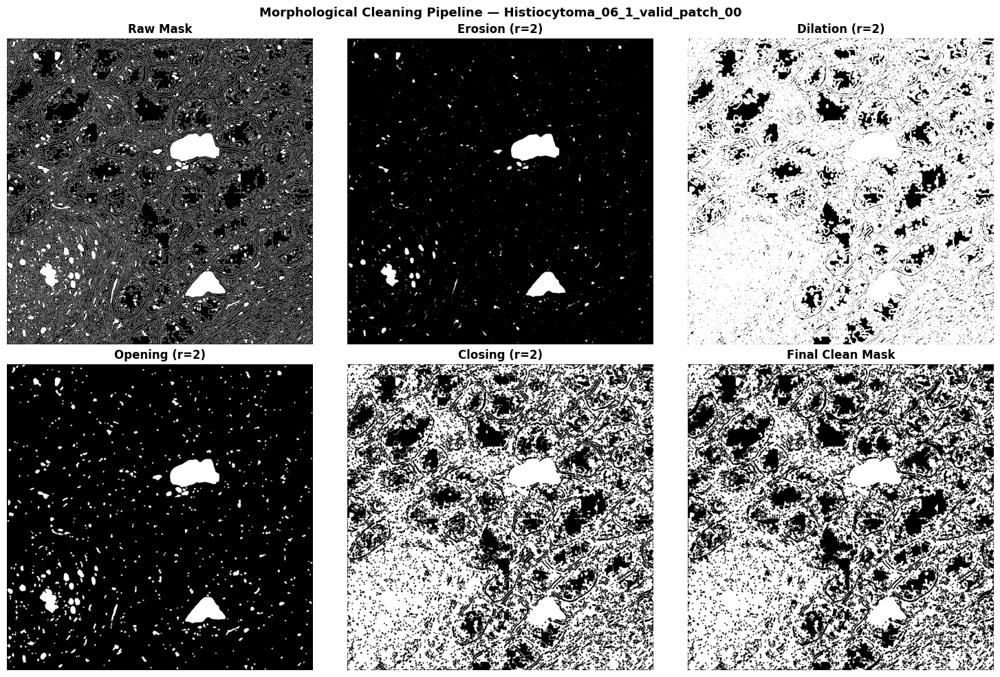

Morphological stages saved → /content/drive/MyDrive/outputs/shape_analysis_output/morphological_stages.png


In [ ]:
# Apply morphological cleaning to all images
print('🔄 Applying morphological cleaning…')
for rec in tqdm(dataset, unit='img'):
    morph = morphological_clean(rec['mask_raw'])
    rec['mask_clean'] = morph['clean']
    rec['morph']      = morph
    io.imsave(
        str(OUTPUT_DIR / 'masks_clean' / (rec['name'] + '_mask_clean.png')),
        img_as_ubyte(rec['mask_clean'])
    )
print('✅ Clean masks saved.')

# ── Morphological stages panel (first image) ────────────────────────────────
rec   = dataset[0]
morph = rec['morph']

stages = [
    ('Raw Mask',             rec['mask_raw']),
    (f'Erosion (r={MORPH_RADIUS})',  morph['eroded']),
    (f'Dilation (r={MORPH_RADIUS})', morph['dilated']),
    (f'Opening (r={MORPH_RADIUS})',  morph['opened']),
    (f'Closing (r={MORPH_RADIUS})',  morph['closed']),
    ('Final Clean Mask',     morph['clean']),
]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for ax, (title, stage_mask) in zip(axes.flat, stages):
    ax.imshow(stage_mask, cmap='gray', vmin=0, vmax=1)
    ax.set_title(title, fontweight='bold')
    n_white = stage_mask.sum()
    ax.set_xlabel(f'White pixels: {n_white:,}', fontsize=9)
    ax.axis('off')

plt.suptitle(f'Morphological Cleaning Pipeline — {rec["name"]}',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'morphological_stages.png', dpi=150)
plt.show()
print(f'Morphological stages saved → {OUTPUT_DIR / "morphological_stages.png"}')

---
## 6. Boundary Representation — 8-Directional Chain Code

### Theory

A **chain code** encodes a boundary as a sequence of direction codes. The 8-directional (Freeman) scheme uses:

```
3  2  1
 \ | /
4 — * — 0
 / | \
5  6  7
```

| Code | Direction  | Δrow | Δcol |
|------|-----------|------|------|
| 0    | East       |  0   | +1   |
| 1    | NE         | -1   | +1   |
| 2    | North      | -1   |  0   |
| 3    | NW         | -1   | -1   |
| 4    | West       |  0   | -1   |
| 5    | SW         | +1   | -1   |
| 6    | South      | +1   |  0   |
| 7    | SE         | +1   | +1   |

**First Difference** encodes the *change* between consecutive codes (mod 8), removing the absolute starting direction and making the code **rotationally invariant** to 45° rotations.

**Shape Number** normalises the first difference sequence by rotating it to its lexicographically smallest permutation, ensuring a unique, canonical descriptor for each shape regardless of start point or orientation.

In [ ]:
# ── Freeman 8-directional lookup ────────────────────────────────────────────
#  Index = direction code (0–7)
#  Value = (delta_row, delta_col)
FREEMAN_DIRS = [
    ( 0,  1),   # 0 East
    (-1,  1),   # 1 North-East
    (-1,  0),   # 2 North
    (-1, -1),   # 3 North-West
    ( 0, -1),   # 4 West
    ( 1, -1),   # 5 South-West
    ( 1,  0),   # 6 South
    ( 1,  1),   # 7 South-East
]

# Reverse lookup: (dr, dc) → direction code
_DIR_MAP = {v: k for k, v in enumerate(FREEMAN_DIRS)}


def _trace_boundary(mask: np.ndarray) -> list[tuple[int, int]]:
    """
    Trace the outer boundary of the largest connected component in `mask`
    using Moore neighbourhood tracing (Jacob's stopping criterion).

    Returns an ordered list of (row, col) boundary pixel coordinates.
    """
    # Label connected components and find the largest one
    labeled = label(mask)
    props   = regionprops(labeled)
    if not props:
        return []
    largest = max(props, key=lambda p: p.area)
    binary  = (labeled == largest.label).astype(np.uint8)

    # Use OpenCV's findContours for reliable, ordered boundary pixels
    # RETR_EXTERNAL: outermost contour only
    # CHAIN_APPROX_NONE: every single boundary pixel (no skipping)
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    if not contours:
        return []

    # cv2 returns (x, y) == (col, row) — convert to (row, col)
    contour = max(contours, key=lambda c: len(c))
    boundary = [(int(pt[0][1]), int(pt[0][0])) for pt in contour]
    return boundary


def compute_chain_code(mask: np.ndarray) -> dict:
    """
    Compute the 8-directional Freeman chain code for the primary object
    in the binary mask, plus its First Difference and Shape Number.

    Parameters
    ----------
    mask : binary mask (bool or uint8), HxW

    Returns
    -------
    dict with keys:
        'boundary'         — list of (row, col) boundary pixels
        'chain_code'       — list of int direction codes (0–7)
        'first_difference' — rotationally invariant difference sequence
        'shape_number'     — normalised, starting-point invariant descriptor
        'start_point'      — (row, col) where tracing began
        'perimeter'        — number of boundary pixels
    """
    boundary = _trace_boundary(mask)
    if len(boundary) < 2:
        return {'boundary': boundary, 'chain_code': [],
                'first_difference': [], 'shape_number': [],
                'start_point': None, 'perimeter': 0}

    # ── Step 1: Build the chain code ────────────────────────────────────────
    chain = []
    for i in range(len(boundary)):
        r0, c0 = boundary[i]
        r1, c1 = boundary[(i + 1) % len(boundary)]
        dr, dc = r1 - r0, c1 - c0

        # Clamp to unit step (handles rare subpixel diagonal artefacts)
        dr = max(-1, min(1, dr))
        dc = max(-1, min(1, dc))

        direction = _DIR_MAP.get((dr, dc))
        if direction is not None:
            chain.append(direction)

    if not chain:
        return {'boundary': boundary, 'chain_code': [],
                'first_difference': [], 'shape_number': [],
                'start_point': boundary[0], 'perimeter': len(boundary)}

    # ── Step 2: First Difference ────────────────────────────────────────────
    # fd[i] = (chain[i] - chain[i-1]) mod 8
    # This encodes turns rather than absolute directions → rotationally invariant
    first_diff = [
        (chain[i] - chain[i - 1]) % 8
        for i in range(len(chain))
    ]

    # ── Step 3: Shape Number ────────────────────────────────────────────────
    # Rotate the first_difference sequence to its lexicographically smallest
    # cyclic permutation → invariant to starting point on the boundary.
    # This ensures two identical shapes traced from different start pixels
    # produce the same descriptor.
    n = len(first_diff)
    doubled = first_diff * 2     # duplicate to allow all cyclic rotations
    best = None
    for i in range(n):
        candidate = doubled[i:i + n]
        if best is None or candidate < best:
            best = candidate
    shape_number = best

    return {
        'boundary'        : boundary,
        'chain_code'      : chain,
        'first_difference': first_diff,
        'shape_number'    : shape_number,
        'start_point'     : boundary[0],
        'perimeter'       : len(boundary),
    }


print('✅ Chain code functions defined.')

✅ Chain code functions defined.


🔄 Computing chain codes…


100%|██████████| 100/100 [00:45<00:00,  2.18img/s]



📊 Chain Code Summary
                             Image  Perimeter Start Point
  Histiocytoma_06_1_valid_patch_00       9926    (0, 119)
  Histiocytoma_06_1_valid_patch_01       8858      (0, 8)
  Histiocytoma_14_1_valid_patch_00       8392      (0, 0)
  Histiocytoma_14_1_valid_patch_01      10121    (0, 556)
  Histiocytoma_22_1_valid_patch_00      15440     (0, 11)
  Histiocytoma_22_1_valid_patch_01      12214     (0, 48)
  Histiocytoma_25_1_valid_patch_00      12708      (0, 8)
  Histiocytoma_25_1_valid_patch_01       9606     (0, 23)
  Histiocytoma_33_1_valid_patch_00       4742      (0, 0)
  Histiocytoma_33_1_valid_patch_01       5057      (0, 3)
  Histiocytoma_37_1_valid_patch_00       7289     (0, 23)
  Histiocytoma_37_1_valid_patch_01       7522    (0, 233)
  Histiocytoma_43_1_valid_patch_00       9821    (0, 130)
  Histiocytoma_43_1_valid_patch_01      21545     (0, 65)
  Histiocytoma_48_1_valid_patch_00       9103    (0, 328)
  Histiocytoma_48_1_valid_patch_01       6210     

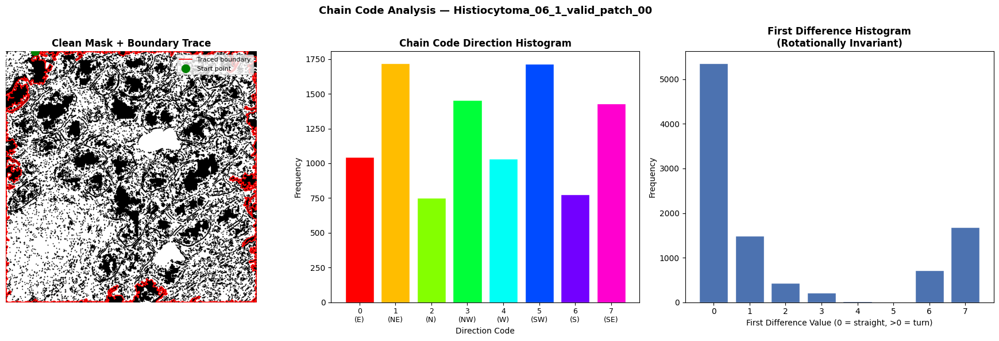

Chain code analysis saved → /content/drive/MyDrive/outputs/shape_analysis_output/chain_code_analysis.png


In [ ]:
# Compute chain codes for all images
print('🔄 Computing chain codes…')
chain_rows = []

for rec in tqdm(dataset, unit='img'):
    cc = compute_chain_code(rec['mask_clean'])
    rec['chain'] = cc

    chain_rows.append({
        'Image'           : rec['name'],
        'Perimeter'       : cc['perimeter'],
        'Start Point'     : cc['start_point'],
        'Chain Code (first 20)': cc['chain_code'][:20],
        'First Diff (first 20)': cc['first_difference'][:20],
        'Shape Number (first 20)': cc['shape_number'][:20],
    })

    # Save full chain code to text file
    with open(OUTPUT_DIR / 'chain_codes' / (rec['name'] + '_chain_code.txt'), 'w') as f:
        f.write(f'Image          : {rec["name"]}\n')
        f.write(f'Start Point    : {cc["start_point"]}\n')
        f.write(f'Perimeter      : {cc["perimeter"]} px\n')
        f.write(f'\nChain Code ({len(cc["chain_code"])} codes):\n')
        f.write(' '.join(map(str, cc['chain_code'])) + '\n')
        f.write(f'\nFirst Difference ({len(cc["first_difference"])} codes):\n')
        f.write(' '.join(map(str, cc['first_difference'])) + '\n')
        f.write(f'\nShape Number ({len(cc["shape_number"])} codes):\n')
        f.write(' '.join(map(str, cc['shape_number'])) + '\n')

chain_df = pd.DataFrame(chain_rows)
print('\n📊 Chain Code Summary')
print('=' * 70)
print(chain_df[['Image', 'Perimeter', 'Start Point']].to_string(index=False))
print('✅ Chain code files saved.')

# ── Visualise boundary tracing (first image) ─────────────────────────────────
rec = dataset[0]
cc  = rec['chain']

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# (A) Clean mask + boundary overlay
axes[0].imshow(rec['mask_clean'], cmap='gray')
if cc['boundary']:
    brows = [p[0] for p in cc['boundary']]
    bcols = [p[1] for p in cc['boundary']]
    axes[0].plot(bcols, brows, 'r-', linewidth=1.2, label='Traced boundary')
    axes[0].plot(cc['start_point'][1], cc['start_point'][0],
                 'go', markersize=10, label='Start point')
    axes[0].legend(fontsize=8, loc='upper right')
axes[0].set_title('Clean Mask + Boundary Trace', fontweight='bold')
axes[0].axis('off')

# (B) Direction histogram of chain code
if cc['chain_code']:
    codes, counts = np.unique(cc['chain_code'], return_counts=True)
    dir_labels = ['E', 'NE', 'N', 'NW', 'W', 'SW', 'S', 'SE']
    full_counts = np.zeros(8, dtype=int)
    full_counts[codes] = counts
    bar_colors = plt.cm.hsv(np.linspace(0, 1, 8, endpoint=False))
    axes[1].bar(range(8), full_counts, color=bar_colors, edgecolor='white')
    axes[1].set_xticks(range(8))
    axes[1].set_xticklabels([f'{c}\n({dir_labels[c]})' for c in range(8)], fontsize=9)
    axes[1].set_xlabel('Direction Code')
    axes[1].set_ylabel('Frequency')
    axes[1].set_title('Chain Code Direction Histogram', fontweight='bold')

# (C) First Difference histogram
if cc['first_difference']:
    fd_codes, fd_counts = np.unique(cc['first_difference'], return_counts=True)
    full_fd = np.zeros(8, dtype=int)
    full_fd[fd_codes] = fd_counts
    axes[2].bar(range(8), full_fd, color='#4C72B0', edgecolor='white')
    axes[2].set_xticks(range(8))
    axes[2].set_xticklabels([str(i) for i in range(8)])
    axes[2].set_xlabel('First Difference Value (0 = straight, >0 = turn)')
    axes[2].set_ylabel('Frequency')
    axes[2].set_title('First Difference Histogram\n(Rotationally Invariant)', fontweight='bold')

plt.suptitle(f'Chain Code Analysis — {rec["name"]}', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'chain_code_analysis.png', dpi=150)
plt.show()
print(f'Chain code analysis saved → {OUTPUT_DIR / "chain_code_analysis.png"}')

In [ ]:
# Print detailed chain code report for the first image
rec = dataset[0]
cc  = rec['chain']
print(f'\n📋 Chain Code Report — {rec["name"]}')
print('=' * 60)
print(f'  Tracing start point : {cc["start_point"]}')
print(f'  Perimeter           : {cc["perimeter"]} boundary pixels')
print(f'  Chain code length   : {len(cc["chain_code"])}')
print(f'\n  Chain Code (first 40 codes):')
print(f'  {cc["chain_code"][:40]}')
print(f'\n  First Difference (first 40) — rotationally invariant:')
print(f'  {cc["first_difference"][:40]}')
print(f'\n  Shape Number (first 40) — starting-point invariant:')
print(f'  {cc["shape_number"][:40]}')
print(f'\n  Rotational Invariance Explanation:')
print(f'  The First Difference encodes turns (Δdirection mod 8) instead of')
print(f'  absolute compass directions. Rotating the object by 45° simply shifts')
print(f'  every code in the chain by a constant offset, but the differences')
print(f'  remain unchanged — hence rotational invariance.')
print(f'  The Shape Number additionally normalises the start point by choosing')
print(f'  the lexicographically smallest cyclic rotation of the first difference.')


📋 Chain Code Report — Histiocytoma_06_1_valid_patch_00
  Tracing start point : (0, 119)
  Perimeter           : 9926 boundary pixels
  Chain code length   : 9926

  Chain Code (first 40 codes):
  [5, 6, 5, 5, 7, 7, 2, 2, 1, 1, 1, 7, 0, 0, 0, 7, 7, 1, 1, 7, 7, 1, 1, 7, 0, 0, 0, 7, 0, 7, 0, 7, 7, 7, 1, 7, 0, 7, 7, 0]

  First Difference (first 40) — rotationally invariant:
  [1, 1, 7, 0, 2, 0, 3, 0, 7, 0, 0, 6, 1, 0, 0, 7, 0, 2, 0, 6, 0, 2, 0, 6, 1, 0, 0, 7, 1, 7, 1, 7, 0, 0, 2, 6, 1, 7, 0, 1]

  Shape Number (first 40) — starting-point invariant:
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 1, 7, 1, 0, 0, 0, 0, 7, 0, 1, 0]

  Rotational Invariance Explanation:
  The First Difference encodes turns (Δdirection mod 8) instead of
  absolute compass directions. Rotating the object by 45° simply shifts
  every code in the chain by a constant offset, but the differences
  remain unchanged — hence rotational invariance.
  The Shape Number additional

---
## 7. Computational Geometry — Convex Hull (Graham Scan)

### Theory

The **Convex Hull** is the smallest convex polygon that encloses all boundary points of the detected region. It characterises the overall shape and can be used to compute:
- **Convexity** = Area(object) / Area(hull) — how convex the shape is
- **Solidity** = same ratio
- Bounding area and hull perimeter

### Graham Scan Algorithm  (O(n log n))

1. **Pivot**: Select the point with the lowest y-coordinate (ties broken by lowest x). This point is guaranteed on the hull.
2. **Sort**: Sort all other points by polar angle relative to the pivot (then by distance for ties).
3. **Scan**: Process points in sorted order, maintaining a stack. For each new point, pop the stack while the last three points make a clockwise or collinear turn (not a left turn). Push the new point.
4. The stack contains the convex hull vertices in counter-clockwise order.

In [ ]:
def _cross_product(O: tuple, A: tuple, B: tuple) -> float:
    """
    2-D cross product of vectors OA and OB.

    Returns:
        > 0  : left turn  (counter-clockwise)  — keep on hull
        = 0  : collinear                        — collinear point (removed)
        < 0  : right turn (clockwise)           — pop from stack
    """
    return (A[0] - O[0]) * (B[1] - O[1]) - (A[1] - O[1]) * (B[0] - O[0])


def graham_scan(points: list[tuple]) -> list[tuple]:
    """
    Compute the convex hull of a set of 2-D points using the Graham Scan algorithm.

    Parameters
    ----------
    points : list of (x, y) tuples

    Returns
    -------
    List of (x, y) hull vertices in counter-clockwise order.
    Returns empty list if fewer than 3 non-collinear points are given.

    Algorithm
    ---------
    1. Remove duplicate points.
    2. Choose pivot p0 = bottommost point (ties: leftmost).
    3. Sort remaining points by polar angle from p0;
       ties broken by distance (keep farthest for each angle).
    4. Process sorted points:
       - Push first two points onto the stack.
       - For each subsequent point p:
           while stack has ≥ 2 points AND cross_product(stack[-2], stack[-1], p) <= 0:
               pop stack[-1]          # non-left turn → not on hull
           push p
    5. Stack is the convex hull.

    Time complexity : O(n log n)  (dominated by the sort step)
    Space complexity: O(n)
    """
    # Remove duplicates and ensure we have a list
    pts = list(set(map(tuple, points)))

    if len(pts) < 3:
        return pts    # degenerate: 0-2 points

    # ── Step 1: Find pivot — bottommost, then leftmost ─────────────────────
    pivot = min(pts, key=lambda p: (p[1], p[0]))

    # ── Step 2: Sort by polar angle from pivot ──────────────────────────────
    def sort_key(p):
        if p == pivot:
            return (-math.pi * 2, 0.0)   # pivot sorts first
        angle = math.atan2(p[1] - pivot[1], p[0] - pivot[0])
        dist  = (p[0] - pivot[0])**2 + (p[1] - pivot[1])**2
        return (angle, dist)

    sorted_pts = sorted(pts, key=sort_key)

    # Remove collinear duplicates at the same angle (keep farthest only)
    filtered = [sorted_pts[0]]
    for i in range(1, len(sorted_pts)):
        if i == len(sorted_pts) - 1:
            filtered.append(sorted_pts[i])
        else:
            cp = _cross_product(pivot, sorted_pts[i], sorted_pts[i + 1])
            if cp != 0:   # not collinear — keep
                filtered.append(sorted_pts[i])
            # else: collinear with next — skip (next is farther)

    if len(filtered) < 3:
        return filtered   # all points are collinear

    # ── Step 3: Graham scan proper ──────────────────────────────────────────
    stack = [filtered[0], filtered[1]]

    for p in filtered[2:]:
        # Pop while the turn at stack[-1] is not a strict left turn
        while len(stack) >= 2 and _cross_product(stack[-2], stack[-1], p) <= 0:
            stack.pop()
        stack.append(p)

    return stack    # convex hull vertices in CCW order


def hull_area(hull_pts: list[tuple]) -> float:
    """
    Shoelace formula for the area of a polygon given its vertices in order.
    Works for both CW and CCW orderings (returns absolute value).
    """
    n = len(hull_pts)
    if n < 3:
        return 0.0
    area = 0.0
    for i in range(n):
        x0, y0 = hull_pts[i]
        x1, y1 = hull_pts[(i + 1) % n]
        area += x0 * y1 - x1 * y0
    return abs(area) / 2.0


def hull_perimeter(hull_pts: list[tuple]) -> float:
    """Euclidean perimeter of a closed polygon."""
    n = len(hull_pts)
    if n < 2:
        return 0.0
    return sum(
        math.hypot(hull_pts[(i+1)%n][0] - hull_pts[i][0],
                   hull_pts[(i+1)%n][1] - hull_pts[i][1])
        for i in range(n)
    )


print('✅ Graham Scan and geometry functions defined.')

✅ Graham Scan and geometry functions defined.


In [ ]:
# Compute convex hulls for all images
print('🔄 Computing convex hulls via Graham Scan…')
hull_rows = []

for rec in tqdm(dataset, unit='img'):
    cc = rec['chain']
    if not cc['boundary']:
        rec['hull'] = []
        continue

    # Convert boundary (row, col) → (x=col, y=row) for standard geometry
    points_xy = [(c, r) for r, c in cc['boundary']]

    hull = graham_scan(points_xy)
    rec['hull'] = hull

    h_area  = hull_area(hull)
    h_perim = hull_perimeter(hull)

    # Object area from the clean mask
    obj_area = int(rec['mask_clean'].sum())
    convexity = obj_area / h_area if h_area > 0 else 0.0

    hull_rows.append({
        'Image'          : rec['name'],
        'Boundary Points': len(cc['boundary']),
        'Hull Vertices'  : len(hull),
        'Hull Area (px²)': round(h_area,  2),
        'Hull Perimeter' : round(h_perim, 2),
        'Object Area'    : obj_area,
        'Convexity'      : round(convexity, 4),
    })

hull_df = pd.DataFrame(hull_rows)
hull_df.to_csv(OUTPUT_DIR / 'convex_hull_metrics.csv', index=False)
print(f'\n✅ Convex hull metrics saved → {OUTPUT_DIR / "convex_hull_metrics.csv"}')
print('\n📊 Convex Hull Summary')
print('=' * 75)
print(hull_df.to_string(index=False))

🔄 Computing convex hulls via Graham Scan…


100%|██████████| 100/100 [00:04<00:00, 22.57img/s]


✅ Convex hull metrics saved → /content/drive/MyDrive/outputs/shape_analysis_output/convex_hull_metrics.csv

📊 Convex Hull Summary
                             Image  Boundary Points  Hull Vertices  Hull Area (px²)  Hull Perimeter  Object Area  Convexity
  Histiocytoma_06_1_valid_patch_00             9926             13        1035382.0         3988.84       599476     0.5790
  Histiocytoma_06_1_valid_patch_01             8858              8        1046470.5         4083.61       644934     0.6163
  Histiocytoma_14_1_valid_patch_00             8392             11        1045250.0         4052.10       586856     0.5615
  Histiocytoma_14_1_valid_patch_01            10121             15         875732.5         3735.64       464416     0.5303
  Histiocytoma_22_1_valid_patch_00            15440             11        1046307.0         4074.23       635361     0.6072
  Histiocytoma_22_1_valid_patch_01            12214             16        1045136.0         4041.64       524066     0.5014
 

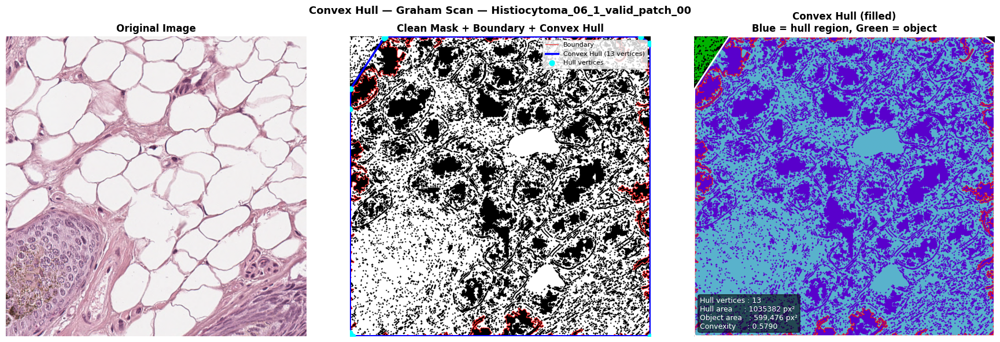

Convex hull visualisation saved → /content/drive/MyDrive/outputs/shape_analysis_output/convex_hull_demo.png


In [ ]:
# ── Visualise convex hull (first image) ──────────────────────────────────────
rec  = dataset[0]
cc   = rec['chain']
hull = rec['hull']

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# (A) Original image
cmap_orig = None if rec['image'].ndim == 3 else 'gray'
axes[0].imshow(rec['image'], cmap=cmap_orig)
axes[0].set_title('Original Image', fontweight='bold')
axes[0].axis('off')

# (B) Clean mask + boundary + hull
axes[1].imshow(rec['mask_clean'], cmap='gray')
if cc['boundary']:
    brows = [p[0] for p in cc['boundary']]
    bcols = [p[1] for p in cc['boundary']]
    axes[1].plot(bcols, brows, 'r-', linewidth=0.8, label='Boundary', alpha=0.8)
if hull:
    hx = [p[0] for p in hull] + [hull[0][0]]
    hy = [p[1] for p in hull] + [hull[0][1]]
    axes[1].plot(hx, hy, 'b-', linewidth=2.5, label=f'Convex Hull ({len(hull)} vertices)')
    axes[1].scatter([p[0] for p in hull], [p[1] for p in hull],
                    c='cyan', s=40, zorder=5, label='Hull vertices')
axes[1].legend(fontsize=8, loc='upper right')
axes[1].set_title('Clean Mask + Boundary + Convex Hull', fontweight='bold')
axes[1].axis('off')

# (C) Convex hull polygon only (filled)
h_img = np.zeros_like(rec['mask_clean'], dtype=np.uint8)
if hull:
    hull_pts_cv = np.array([[p[0], p[1]] for p in hull], dtype=np.int32).reshape(-1, 1, 2)
    cv2.fillPoly(h_img, [hull_pts_cv], 1)
    # Overlay: hull (blue tint) + object boundary (red)
    display = np.stack([h_img.astype(float) * 0.35,
                        rec['mask_clean'].astype(float) * 0.7,
                        h_img.astype(float) * 0.8], axis=-1)
    axes[2].imshow(display)
    if cc['boundary']:
        brows = [p[0] for p in cc['boundary']]
        bcols = [p[1] for p in cc['boundary']]
        axes[2].plot(bcols, brows, 'r-', linewidth=0.8, alpha=0.9)
    axes[2].plot(hx, hy, 'w-', linewidth=2)
    hr = hull_df[hull_df['Image'] == rec['name']]
    if not hr.empty:
        r = hr.iloc[0]
        info = (f'Hull vertices : {r["Hull Vertices"]}\n'
                f'Hull area     : {r["Hull Area (px²)"]:.0f} px²\n'
                f'Object area   : {r["Object Area"]:,} px²\n'
                f'Convexity     : {r["Convexity"]:.4f}')
        axes[2].text(0.02, 0.02, info, transform=axes[2].transAxes,
                     fontsize=9, verticalalignment='bottom',
                     bbox=dict(boxstyle='round', facecolor='black', alpha=0.6),
                     color='white')
else:
    axes[2].imshow(h_img, cmap='gray')
axes[2].set_title('Convex Hull (filled)\nBlue = hull region, Green = object', fontweight='bold')
axes[2].axis('off')

plt.suptitle(f'Convex Hull — Graham Scan — {rec["name"]}',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'convex_hulls' / (rec['name'] + '_hull.png'), dpi=150)
plt.savefig(OUTPUT_DIR / 'convex_hull_demo.png', dpi=150)
plt.show()
print(f'Convex hull visualisation saved → {OUTPUT_DIR / "convex_hull_demo.png"}')

In [ ]:
# Save a hull visualisation for every image in the dataset
print('🔄 Saving hull visualisations for all images…')
for rec in tqdm(dataset, unit='img'):
    cc   = rec['chain']
    hull = rec['hull']
    if not hull or not cc['boundary']:
        continue

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(rec['mask_clean'], cmap='gray')

    brows = [p[0] for p in cc['boundary']]
    bcols = [p[1] for p in cc['boundary']]
    ax.plot(bcols, brows, 'r-', linewidth=0.8, alpha=0.7, label='Boundary')

    hx = [p[0] for p in hull] + [hull[0][0]]
    hy = [p[1] for p in hull] + [hull[0][1]]
    ax.plot(hx, hy, 'b-', linewidth=2.5, label=f'Hull ({len(hull)} pts)')
    ax.scatter([p[0] for p in hull], [p[1] for p in hull],
               c='cyan', s=30, zorder=5)

    ax.set_title(rec['name'], fontweight='bold')
    ax.legend(fontsize=8)
    ax.axis('off')
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'convex_hulls' / (rec['name'] + '_hull.png'), dpi=120)
    plt.close()

print('✅ All hull visualisations saved.')

🔄 Saving hull visualisations for all images…


100%|██████████| 100/100 [01:24<00:00,  1.19img/s]

✅ All hull visualisations saved.


---
## 8. Final Summary Dashboard

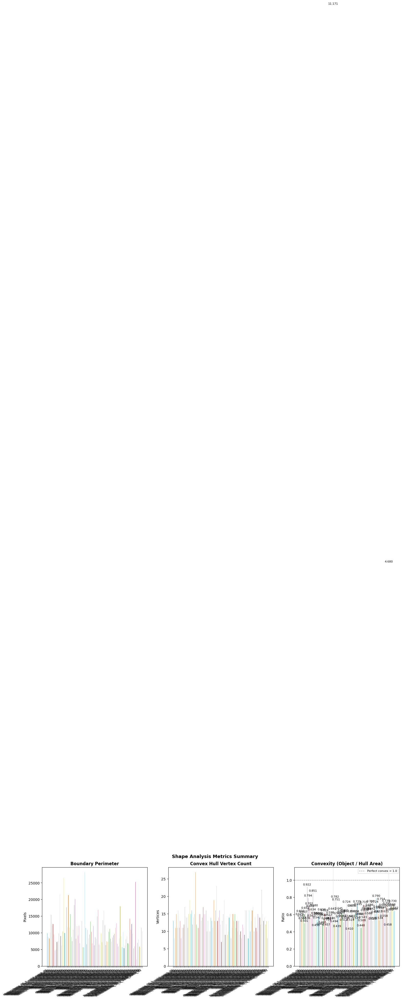

Summary chart saved → /content/drive/MyDrive/outputs/shape_analysis_output/summary_metrics.png


In [ ]:
# ── Metrics bar charts ────────────────────────────────────────────────────────
if len(hull_df) > 0:
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    names = hull_df['Image'].tolist()
    x = np.arange(len(names))
    bar_w = 0.6
    colors = plt.cm.tab20.colors

    axes[0].bar(x, chain_df['Perimeter'], # Fixed: Changed from hull_df['Perimeter'] to chain_df['Perimeter']
                color=colors[:len(names)], edgecolor='white', width=bar_w)
    axes[0].set_xticks(x); axes[0].set_xticklabels(names, rotation=30, ha='right', fontsize=8)
    axes[0].set_ylabel('Pixels'); axes[0].set_title('Boundary Perimeter', fontweight='bold')

    axes[1].bar(x, hull_df['Hull Vertices'],
                color=colors[:len(names)], edgecolor='white', width=bar_w)
    axes[1].set_xticks(x); axes[1].set_xticklabels(names, rotation=30, ha='right', fontsize=8)
    axes[1].set_ylabel('Vertices'); axes[1].set_title('Convex Hull Vertex Count', fontweight='bold')

    bars = axes[2].bar(x, hull_df['Convexity'],
                       color=colors[:len(names)], edgecolor='white', width=bar_w)
    axes[2].axhline(1.0, color='gray', linestyle='--', linewidth=1, label='Perfect convex = 1.0')
    axes[2].set_ylim(0, 1.15)
    axes[2].set_xticks(x); axes[2].set_xticklabels(names, rotation=30, ha='right', fontsize=8)
    axes[2].set_ylabel('Ratio'); axes[2].set_title('Convexity (Object / Hull Area)', fontweight='bold')
    axes[2].legend(fontsize=8)
    for bar, v in zip(bars, hull_df['Convexity']):
        axes[2].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                     f'{v:.3f}', ha='center', va='bottom', fontsize=8)

    plt.suptitle('Shape Analysis Metrics Summary', fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'summary_metrics.png', dpi=150)
    plt.show()
    print(f'Summary chart saved → {OUTPUT_DIR / "summary_metrics.png"}')

In [ ]:
print('=' * 70)
print('               SHAPE ANALYSIS PIPELINE SUMMARY')
print('=' * 70)
print(f'  Images processed             : {len(dataset)}')
print(f'  Segmentation method          : {EDGE_METHOD.upper()}')
print(f'  Morphological SE radius      : {MORPH_RADIUS}px  (disk)')
print(f'  Min object size              : {MIN_OBJECT_SIZE}px')
print()
print(f'  Outputs written to: {OUTPUT_DIR.resolve()}')
print(f'    ├─ masks_raw/            Raw Canny/Sobel masks')
print(f'    ├─ masks_clean/          Morphologically cleaned masks')
print(f'    ├─ chain_codes/          Per-image .txt chain code files')
print(f'    ├─ convex_hulls/         Per-image hull overlay PNGs')
print(f'    ├─ convex_hull_metrics.csv')
print(f'    ├─ segmentation_comparison.png')
print(f'    ├─ morphological_stages.png')
print(f'    ├─ chain_code_analysis.png')
print(f'    ├─ convex_hull_demo.png')
print(f'    └─ summary_metrics.png')
print()
if len(hull_df) > 0:
    print(f'  Mean convexity               : {hull_df["Convexity"].mean():.4f}')
    print(f'  Mean hull vertices           : {hull_df["Hull Vertices"].mean():.1f}')
    print(f'  Mean boundary perimeter      : {chain_df["Perimeter"].mean():.0f} px')
print('=' * 70)
print('  ✅ Pipeline complete.')
print('=' * 70)

               SHAPE ANALYSIS PIPELINE SUMMARY
  Images processed             : 100
  Segmentation method          : CANNY
  Morphological SE radius      : 2px  (disk)
  Min object size              : 100px

  Outputs written to: /content/drive/MyDrive/outputs/shape_analysis_output
    ├─ masks_raw/            Raw Canny/Sobel masks
    ├─ masks_clean/          Morphologically cleaned masks
    ├─ chain_codes/          Per-image .txt chain code files
    ├─ convex_hulls/         Per-image hull overlay PNGs
    ├─ convex_hull_metrics.csv
    ├─ segmentation_comparison.png
    ├─ morphological_stages.png
    ├─ chain_code_analysis.png
    ├─ convex_hull_demo.png
    └─ summary_metrics.png

  Mean convexity               : 0.7576
  Mean hull vertices           : 13.1
  Mean boundary perimeter      : 10311 px
  ✅ Pipeline complete.
